In [2]:
%matplotlib inline 
from matplotlib import pyplot as plt
import numpy as np


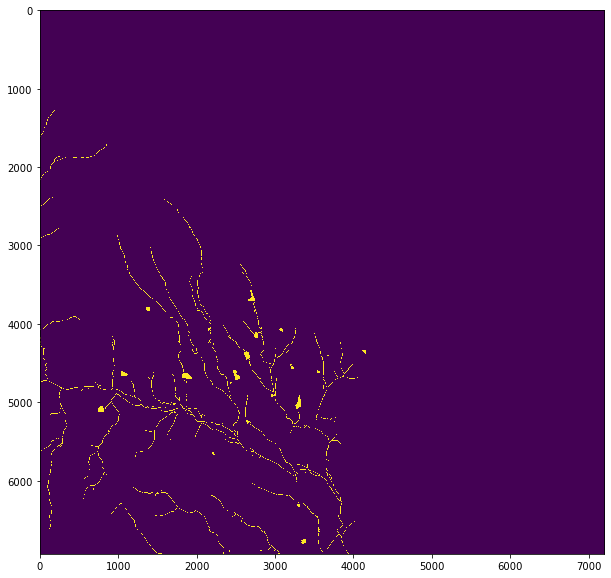

In [2]:
groundtruthlist = np.load('./sample/augmented_top_half/test_label.npy')
fig= plt.figure(figsize=(25,10))
plt.imshow(groundtruthlist, interpolation='nearest')
plt.show()

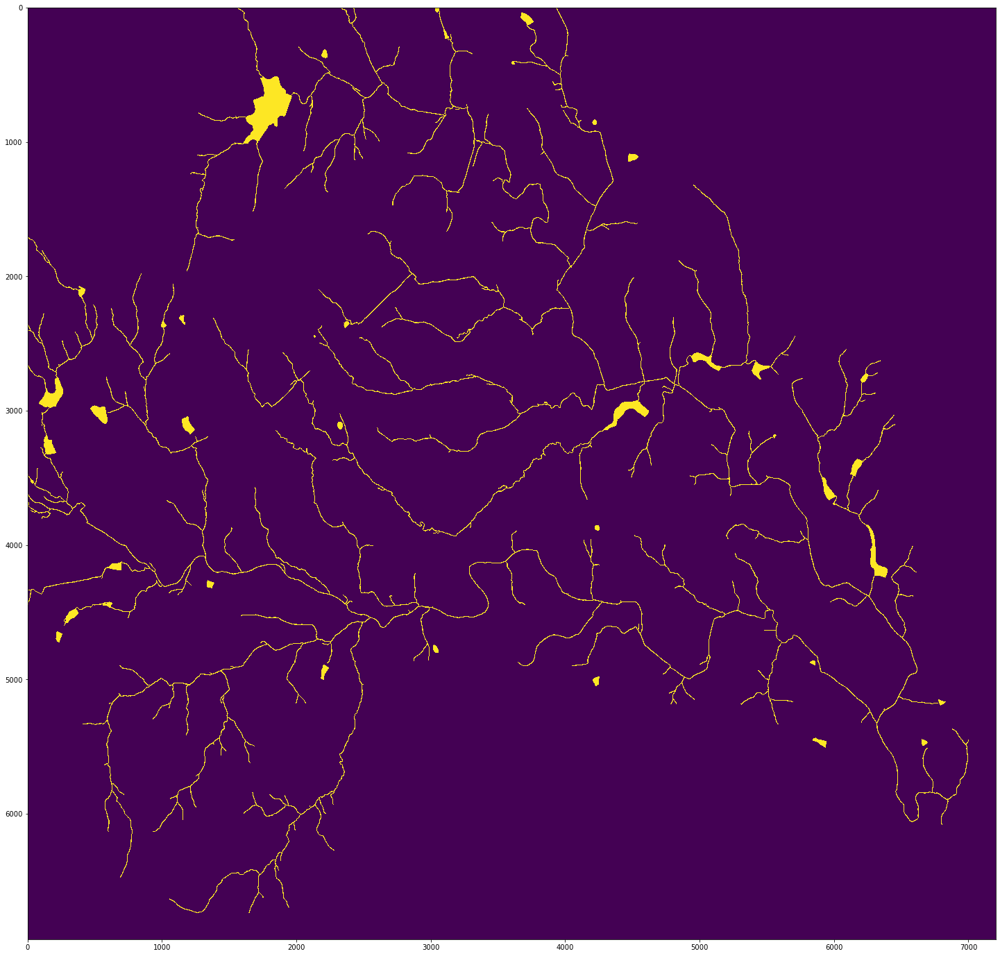

In [10]:

groundtruthlist = np.load('../Covington_data/Total_data/reference_nodata_as_0.npy')
fig= plt.figure(figsize=(25,50))
plt.imshow(groundtruthlist[groundtruthlist.shape[0]//2:,groundtruthlist.shape[1]//2:], interpolation='nearest')
plt.show()

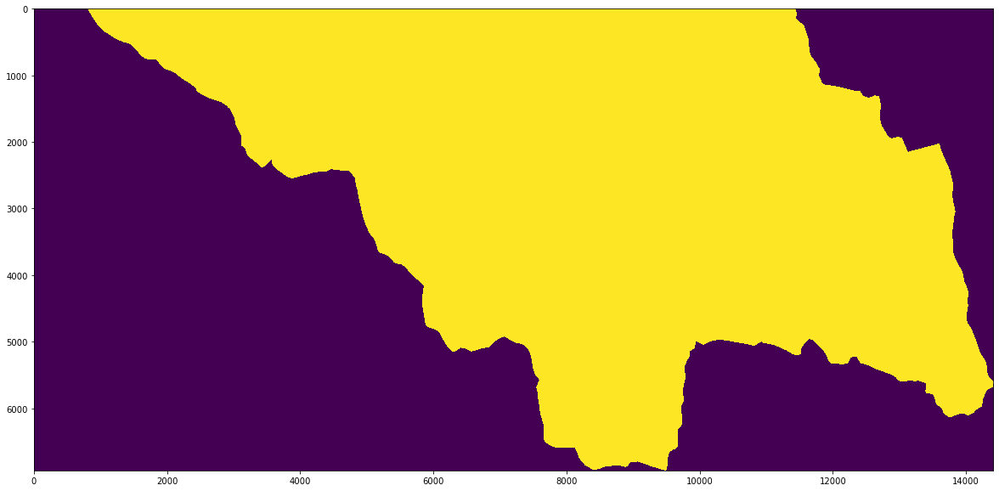

In [21]:
mask = np.load('../Covington_data/Total_data/bottom_half_test_mask.npy')
fig= plt.figure(figsize=(25,10))
plt.imshow(mask, interpolation='nearest')
plt.show()

# Train Data

80


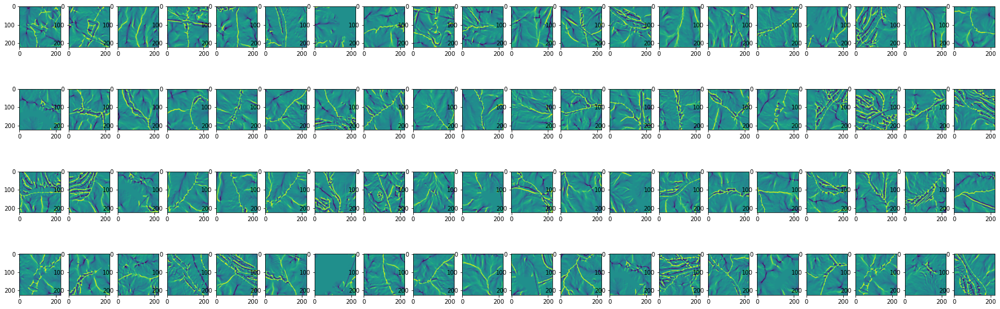

In [3]:
mask = np.load('./sample/augmented_bottom_half/train_data.npy')[:80]
# mask = np.load('./samples/400/2/vali_label.npy')
print(len(mask))
import matplotlib.pyplot as plt
fig, axes = plt.subplots(len(mask)//20,20, figsize=(30,10))
count = 0
for i,ax in enumerate(axes.flat):
    count+=1
    ax.imshow(mask[i, :, :, 0])
    if count > 80:
        break

(80, 224, 224, 1)


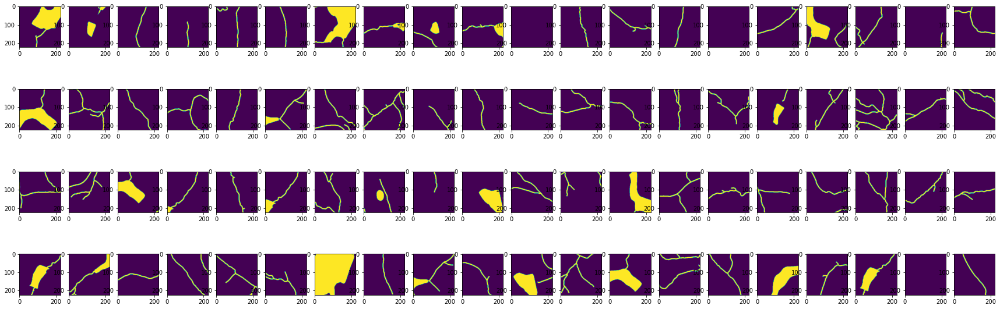

In [42]:
mask = np.load('./sample/augmented_bottom_half/train_label.npy')[:80]
# mask = np.load('./samples/400/2/vali_label.npy')
print(mask.shape)
import matplotlib.pyplot as plt
fig, axes = plt.subplots(len(mask)//20,20, figsize=(30,10))
count = 0
for i,ax in enumerate(axes.flat):
    count+=1
    ax.imshow(mask[i, :, :, 0])
    if count > 80:
        break

# Validation Data

80


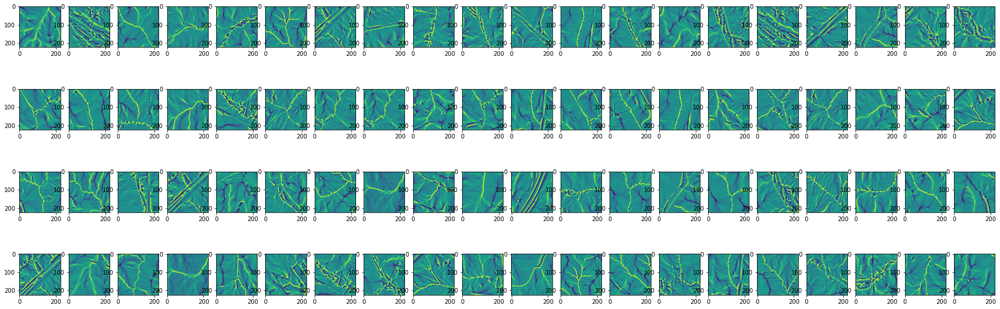

In [45]:
mask = np.load('./sample/augmented_bottom_half/vali_data.npy')[:80]
# mask = np.load('./samples/400/2/vali_label.npy')
print(len(mask))
import matplotlib.pyplot as plt
fig, axes = plt.subplots(len(mask)//20,20, figsize=(30,10))
count = 0
for i,ax in enumerate(axes.flat):
    count+=1
    ax.imshow(mask[i, :, :, 0])
    if count > 80:
        break

80


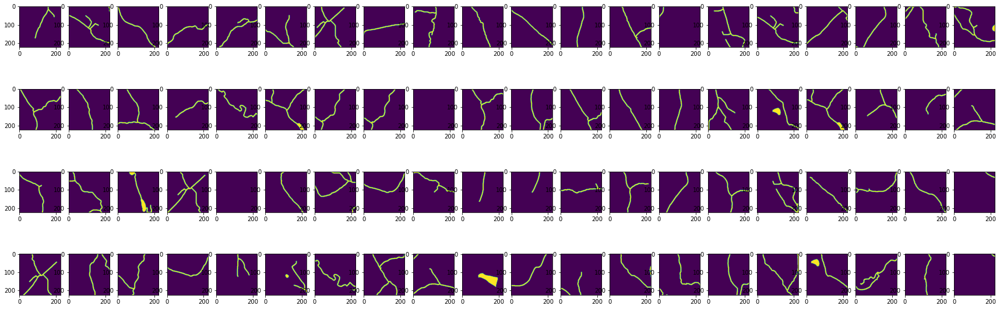

In [44]:
mask = np.load('./sample/augmented_bottom_half/vali_label.npy')[:80]
# mask = np.load('./samples/400/2/vali_label.npy')
print(len(mask))
import matplotlib.pyplot as plt
fig, axes = plt.subplots(len(mask)//20,20, figsize=(30,10))
count = 0
for i,ax in enumerate(axes.flat):
    count+=1
    ax.imshow(mask[i, :, :, 0])
    if count > 80:
        break

# Test data

80


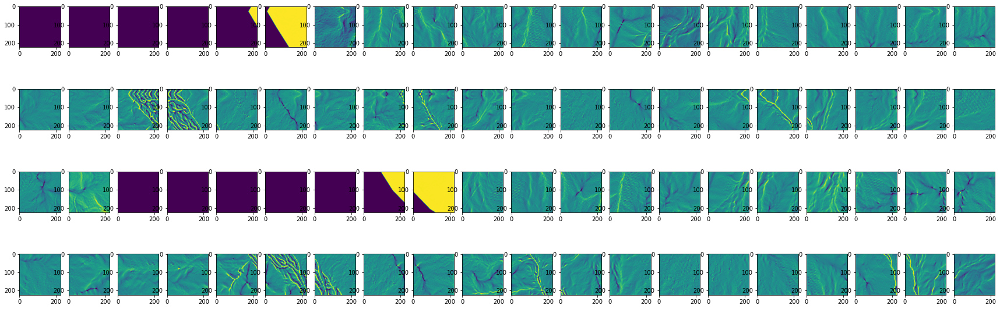

In [9]:
mask = np.load('./sample/augmented_bottom_half/test_data.npy')[:80]
# mask = np.load('./samples/400/2/vali_label.npy')
print(len(mask))
import matplotlib.pyplot as plt
fig, axes = plt.subplots(len(mask)//20,20, figsize=(30,10))
count = 0
for i,ax in enumerate(axes.flat):
    count+=1
    ax.imshow(mask[i, :, :, 0])
    if count > 80:
        break

(6934, 7203)


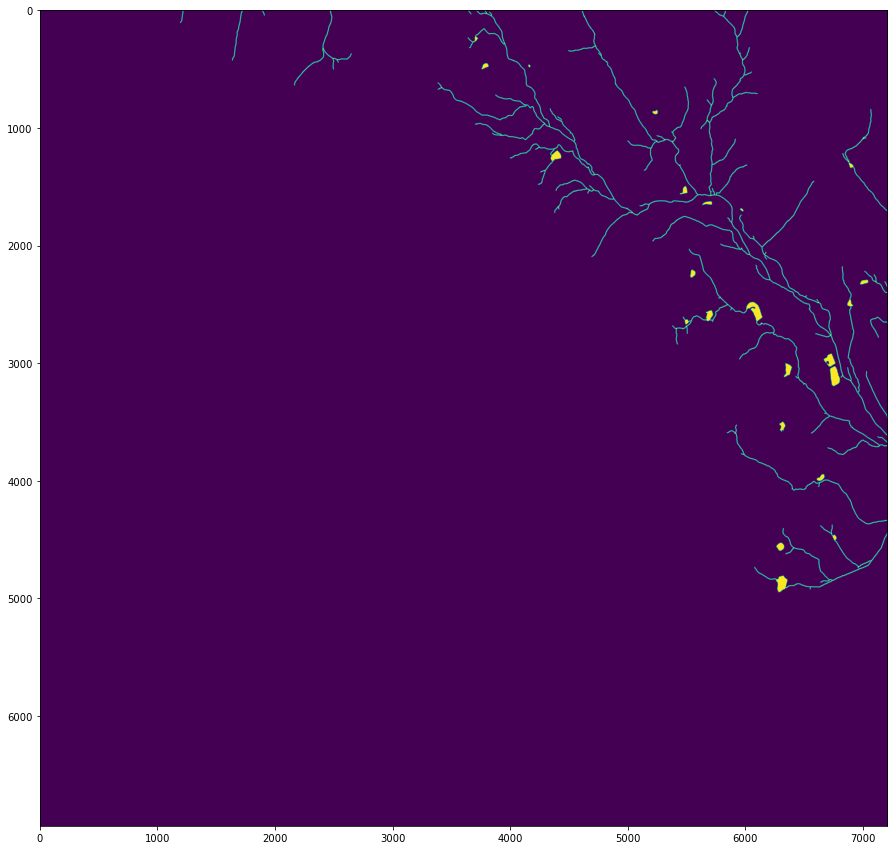

In [28]:
# mask = np.load('./samples/200/1/train_label.npy')
mask = np.load('./sample/augmented_bottom_half/test_label.npy')
print(mask.shape)
import matplotlib.pyplot as plt
plt.figure(figsize=(20,15))
plt.imshow(mask)

80


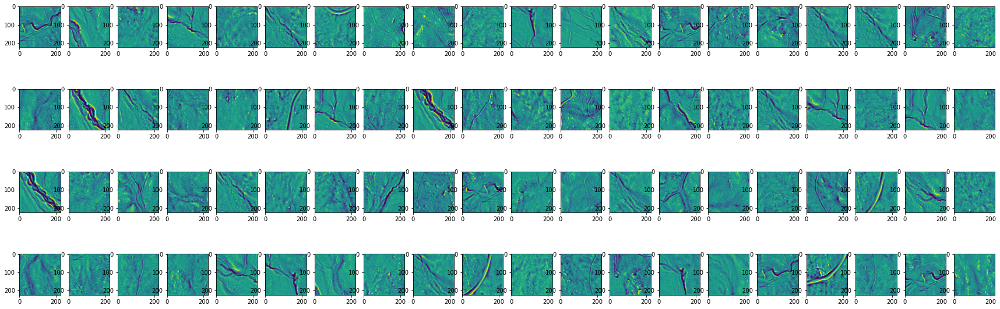

In [11]:
mask = np.load('./sample/augmented_top_half/vali_data.npy')[40:120]
# mask = np.load('./samples/400/2/vali_label.npy')
print(len(mask))
import matplotlib.pyplot as plt
fig, axes = plt.subplots(len(mask)//20,20, figsize=(30,10))
count = 0
for i,ax in enumerate(axes.flat):
    count+=1
    ax.imshow(mask[i, :, :, 2])
    if count > 80:
        break

In [15]:
prediction = np.load('./Prediction_results/200\prediction_result__train_from_scratch_No_NAIP_200_samples_r7_.npy')
print(prediction.shape)
import matplotlib.pyplot as plt
fig, axes = plt.subplots(20,37+5, figsize=(224,150))
for i,ax in enumerate(axes.flat):
    ax.imshow(prediction[i, :, :, 0])

(1764, 224, 224, 1)


# Test Data

In [12]:
import copy
import random
import sys
import numpy as np
from sklearn.metrics import f1_score, precision_score,recall_score
import glob
# print("working on:",path)
buf =30
# #prediction model from scratch
preds_test_mod = np.load('./sample/augmented_top_half/test_data.npy')
print("preds_test_mod",preds_test_mod.shape)

dim = np.load('./sample/augmented_top_half/test_label.npy').shape
numr = dim[0]//(224 - buf*2)
numc = dim[1]//(224 - buf*2)

print("rows:", numr , "columns:", numc)
count = -1
for i in range(numr):

#     if(i == 15):
#         print("row: ",i,"column: ",j, "count", count)
#         break 

    for j in range(numc-1):
        count += 1    
        temp = preds_test_mod[count][buf:-buf,buf:-buf]
        if j == 0:
            rows = temp
        else:
            rows = np.concatenate((rows,temp),axis = 1)

    if i == 0:
        prediction_map = copy.copy(rows)
    else:
        prediction_map = np.concatenate((prediction_map,rows),axis = 0)

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(250,100))

prediction_map_ = prediction_map[:,:,2]
mask = np.load('./sample/augmented_top_half/test_mask.npy')[:prediction_map.shape[0],:prediction_map.shape[1]]
ax1.imshow(prediction_map_, interpolation='nearest',vmin=0.5, vmax=1)

reference_mask = np.load('./sample/augmented_top_half/test_label.npy')[:prediction_map.shape[0],:prediction_map.shape[1]]
ax2.imshow(reference_mask, interpolation='nearest')

plt.tight_layout()
# Make space for title
plt.subplots_adjust(top=0.85)
plt.show()

preds_test_mod (1764, 224, 224, 8)
rows: 42 columns: 43


<Figure size 1800x720 with 0 Axes>

<Figure size 1800x720 with 0 Axes>

# Prediction Results

## Training from scratch 

In [3]:
import copy
import random
import sys
import numpy as np
from sklearn.metrics import f1_score, precision_score,recall_score
import glob
# print("working on:",path)
buf =30
# #prediction model from scratch
preds_test_mod = np.load('./prediction_results/prediction_result_train_from_scratch_No_NAIP_top_half_augmented_50_epochs_3_save.npy')
# print("preds_test_mod",preds_test_mod.shape)

dim = np.load('./sample/augmented_top_half/test_label.npy').shape
numr = dim[0]//(224 - buf*2)
numc = dim[1]//(224 - buf*2)

print("rows:", numr , "columns:", numc)
count = -1
for i in range(numr):

#     if(i == 15):
#         print("row: ",i,"column: ",j, "count", count)
#         break 

    for j in range(numc-1):
        count += 1    
        temp = preds_test_mod[count][buf:-buf,buf:-buf]
        if j == 0:
            rows = temp
        else:
            rows = np.concatenate((rows,temp),axis = 1)

    if i == 0:
        prediction_map = copy.copy(rows)
    else:
        prediction_map = np.concatenate((prediction_map,rows),axis = 0)

prediction_map = prediction_map[:,:,0]

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(250,100))

mask = np.load('./sample/augmented_top_half/test_mask.npy')[:prediction_map.shape[0],:prediction_map.shape[1]]
ax1.imshow(np.logical_and(prediction_map,mask), interpolation='nearest')

reference_mask = np.load('./sample/augmented_top_half/test_label.npy')[:prediction_map.shape[0],:prediction_map.shape[1]]
ax2.imshow(reference_mask, interpolation='nearest')

plt.tight_layout()
# Make space for title
plt.subplots_adjust(top=0.85)
plt.show()

rows: 42 columns: 43


In [5]:
import copy
import random
import sys
import numpy as np
from sklearn.metrics import f1_score, precision_score,recall_score
import glob
# print("working on:",path)
buf =30
# #prediction model from scratch
preds_test_mod = np.load('./prediction_results/prediction_result_train_from_scratch_No_NAIP_top_half_augmented_50_epochs_3_save_btm.npy')
# print("preds_test_mod",preds_test_mod.shape)

dim = np.load('./sample/augmented_bottom_half/test_label.npy').shape
numr = dim[0]//(224 - buf*2)
numc = dim[1]//(224 - buf*2)

print("rows:", numr , "columns:", numc)
count = -1
for i in range(numr):

#     if(i == 15):
#         print("row: ",i,"column: ",j, "count", count)
#         break 

    for j in range(numc-1):
        count += 1    
        temp = preds_test_mod[count][buf:-buf,buf:-buf]
        if j == 0:
            rows = temp
        else:
            rows = np.concatenate((rows,temp),axis = 1)

    if i == 0:
        prediction_map = copy.copy(rows)
    else:
        prediction_map = np.concatenate((prediction_map,rows),axis = 0)

prediction_map = prediction_map[:,:,0]

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(250,100))

mask = np.load('./sample/augmented_bottom_half/test_mask.npy')[:prediction_map.shape[0],:prediction_map.shape[1]]
ax1.imshow(np.logical_and(prediction_map,mask), interpolation='nearest')

reference_mask = np.load('./sample/augmented_bottom_half/test_label.npy')[:prediction_map.shape[0],:prediction_map.shape[1]]
ax2.imshow(reference_mask, interpolation='nearest')

plt.tight_layout()
# Make space for title
plt.subplots_adjust(top=0.85)
plt.show()

rows: 42 columns: 43


### Transfer Learning 

In [46]:
import copy
import random
import sys
import numpy as np
from sklearn.metrics import f1_score, precision_score,recall_score
import glob
# print("working on:",path)
buf =30
# #prediction model from scratch
preds_test_mod = np.load('./prediction_results/prediction_result_transfered_No_NAIP_bottom_half_augmented_50_epochs_3.npy')
# print("preds_test_mod",preds_test_mod.shape)

dim = np.load('./sample/augmented_bottom_half/test_label.npy').shape
numr = dim[0]//(224 - buf*2)
numc = dim[1]//(224 - buf*2)

print("rows:", numr , "columns:", numc)
count = -1
for i in range(numr):

#     if(i == 15):
#         print("row: ",i,"column: ",j, "count", count)
#         break 

    for j in range(numc-1):
        count += 1    
        temp = preds_test_mod[count][buf:-buf,buf:-buf]
        if j == 0:
            rows = temp
        else:
            rows = np.concatenate((rows,temp),axis = 1)

    if i == 0:
        prediction_map = copy.copy(rows)
    else:
        prediction_map = np.concatenate((prediction_map,rows),axis = 0)

prediction_map = prediction_map[:,:,0]

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(250,100))

mask = np.load('./sample/augmented_bottom_half/test_mask.npy')[:prediction_map.shape[0],:prediction_map.shape[1]]
ax1.imshow(np.logical_and(prediction_map,mask), interpolation='nearest')

reference_mask = np.load('./sample/augmented_bottom_half/test_label.npy')[:prediction_map.shape[0],:prediction_map.shape[1]]
ax2.imshow(reference_mask, interpolation='nearest')

plt.tight_layout()
# Make space for title
plt.subplots_adjust(top=0.85)
plt.show()

rows: 42 columns: 43
